## Linear Regression - Boston Housing Market

### Setup

In [175]:
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import sklearn
import statsmodels.api as sm
from statsmodels.formula.api import ols
from sklearn.linear_model import LinearRegression

import seaborn as sns
import cufflinks as cf

# special matplotlib argument for improved plots
from matplotlib import rcParams
sns.set_style("whitegrid")
sns.set_context("poster")

In [176]:
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

In [177]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

### Dataset

In [178]:
from sklearn.datasets import load_boston
boston = load_boston()

In [179]:
boston.keys()

dict_keys(['feature_names', 'target', 'DESCR', 'data'])

In [180]:
# columns name
boston.feature_names

array(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD',
       'TAX', 'PTRATIO', 'B', 'LSTAT'], 
      dtype='<U7')

In [181]:
# Housing price
boston.target[:3]

array([ 24. ,  21.6,  34.7])

In [182]:
# description of Boston housing data set
print (boston.DESCR[100:1400])

   :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive
    
    :Median Value (attribute 14) is usually the target

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pupil-teacher ratio by town
        - B        1000(Bk - 0.63)^2 where Bk is the proportion of blacks by t

#### _Convert to DataFrame (set columns)_

In [183]:
df=pd.DataFrame(boston.data, columns=boston.feature_names)
df.head(3)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03


#### _Rename columns_

In [184]:
df.rename(columns={'CRIM' : 'crime_rate',
                   'ZN' : 'zone',
                   'INDUS' : 'INDUS',
                   'CHAS' : 'CHAS',
                   'NOX' : 'NOX',
                   'RM' : 'room',
                   'AGE' : 'AGE',
                   'DIS' : 'distances',
                   'RAD' : 'RAD',
                   'TAX' : 'tax',
                   'PTRATIO' : 'pupil_teacher_ratio',
                   'B' : 'B',
                   'LSTAT' : 'lower_status',
                   'MEDV' : 'owner_occupied_homes'}, inplace=True)
df.head(3)

,crime_rate,zone,INDUS,CHAS,NOX,room,AGE,distances,RAD,tax,pupil_teacher_ratio,B,lower_status
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03


#### Add housing price
_price = boston.target_

In [185]:
df['PRICE']=boston.target
df.head(3)

,crime_rate,zone,INDUS,CHAS,NOX,room,AGE,distances,RAD,tax,pupil_teacher_ratio,B,lower_status,PRICE
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7


### Get basic statistical information

In [186]:
#Summary statistics
df.describe()

,crime_rate,zone,INDUS,CHAS,NOX,room,AGE,distances,RAD,tax,pupil_teacher_ratio,B,lower_status,PRICE
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.593761,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063,22.532806
std,8.596783,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062,9.197104
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000,17.025000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000,21.200000
75%,3.647423,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000,25.000000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000


* count
* mean: average
* std: 'how spread'
* min: minimum value
* 25%: 25th percentile (25% of the data)
* 50%: 50th percentile (50% of the data)
* 75%: 75th percentile (75% of the data)
* max: maximum value

#### _Correlation matrix_ 
* relationship between the variables
* measure of the degree of linear relationship between two variables
* +/- direction of the relationship
    * +: one variable is increase/decrease --> other one is increase/decrease too
    * -: one variable is decrease/increase --> other one is decrease/increase
* absolute value is the strength of the relationship:
    * r=0 : absence of linear relationship
    * r=1: perfect linear relationship

In [187]:
#correlation coefficients between of the  variables
df.corr()

,crime_rate,zone,INDUS,CHAS,NOX,room,AGE,distances,RAD,tax,pupil_teacher_ratio,B,lower_status,PRICE
crime_rate,1.000000,-0.199458,0.404471,-0.055295,0.417521,-0.219940,0.350784,-0.377904,0.622029,0.579564,0.288250,-0.377365,0.452220,-0.385832
zone,-0.199458,1.000000,-0.533828,-0.042697,-0.516604,0.311991,-0.569537,0.664408,-0.311948,-0.314563,-0.391679,0.175520,-0.412995,0.360445
INDUS,0.404471,-0.533828,1.000000,0.062938,0.763651,-0.391676,0.644779,-0.708027,0.595129,0.720760,0.383248,-0.356977,0.603800,-0.483725
CHAS,-0.055295,-0.042697,0.062938,1.000000,0.091203,0.091251,0.086518,-0.099176,-0.007368,-0.035587,-0.121515,0.048788,-0.053929,0.175260
NOX,0.417521,-0.516604,0.763651,0.091203,1.000000,-0.302188,0.731470,-0.769230,0.611441,0.668023,0.188933,-0.380051,0.590879,-0.427321
room,-0.219940,0.311991,-0.391676,0.091251,-0.302188,1.000000,-0.240265,0.205246,-0.209847,-0.292048,-0.355501,0.128069,-0.613808,0.695360
AGE,0.350784,-0.569537,0.644779,0.086518,0.731470,-0.240265,1.000000,-0.747881,0.456022,0.506456,0.261515,-0.273534,0.602339,-0.376955
distances,-0.377904,0.664408,-0.708027,-0.099176,-0.769230,0.205246,-0.747881,1.000000,-0.494588,-0.534432,-0.232471,0.291512,-0.496996,0.249929
RAD,0.622029,-0.311948,0.595129,-0.007368,0.611441,-0.209847,0.456022,-0.494588,1.000000,0.910228,0.464741,-0.444413,0.488676,-0.381626
tax,0.579564,-0.314563,0.720760,-0.035587,0.668023,-0.292048,0.506456,-0.534432,0.910228,1.000000,0.460853,-0.441808,0.543993,-0.468536


### Heatmap

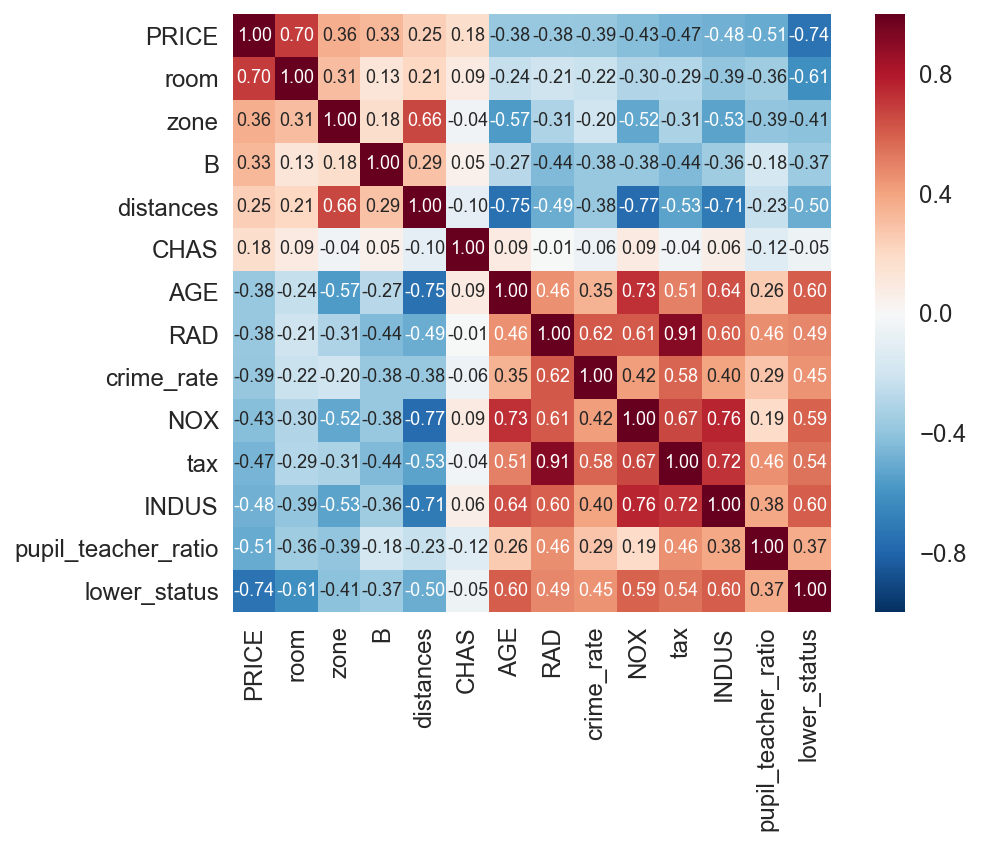

In [188]:
n=len(df.columns) # n= no. of variables
corrmat = df.corr()
cols = corrmat.nlargest(n, 'PRICE')['PRICE'].index
cm = np.corrcoef(df[cols].values.T)
sns.set(font_scale=1.20)
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 9}, yticklabels=cols.values, xticklabels=cols.values)
plt.show()

### Scatter plots

### Relationship between 'crime_rate'/ 'room / 'pupil_teacher_ratio'/'lower_status' ~ 'PRICE'

In [189]:
df.corr()[['PRICE']]

,PRICE
crime_rate,-0.385832
zone,0.360445
INDUS,-0.483725
CHAS,0.175260
NOX,-0.427321
room,0.695360
AGE,-0.376955
distances,0.249929
RAD,-0.381626
tax,-0.468536


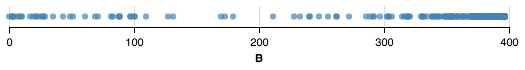

In [241]:
from altair import Chart

Chart(df).mark_circle().encode(x='B')

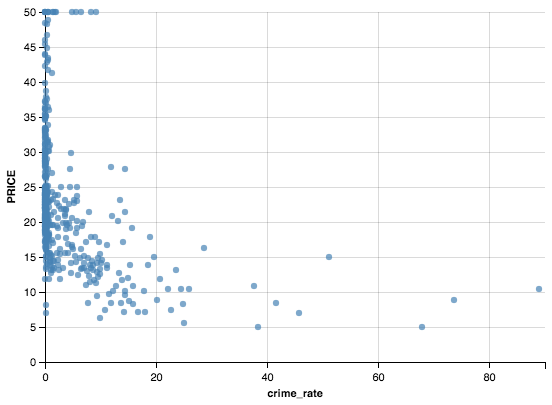

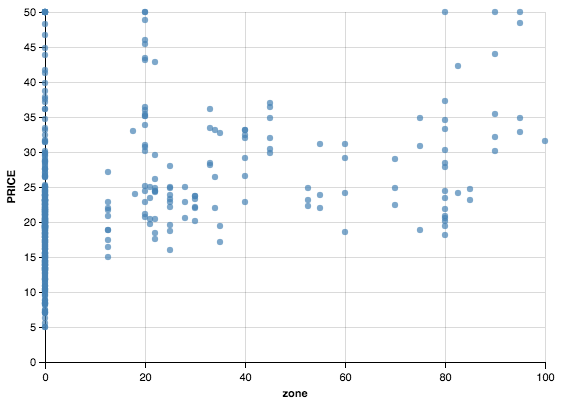

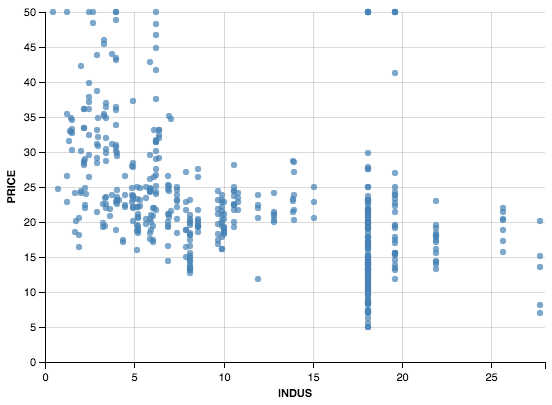

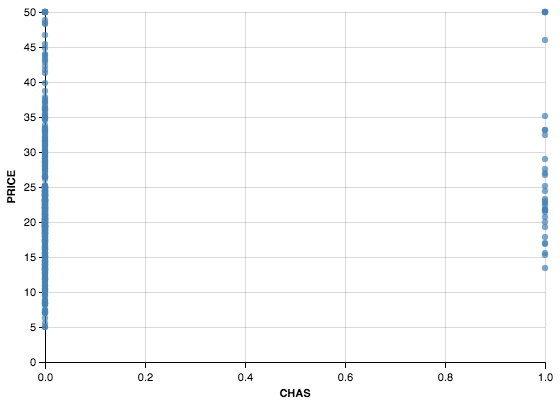

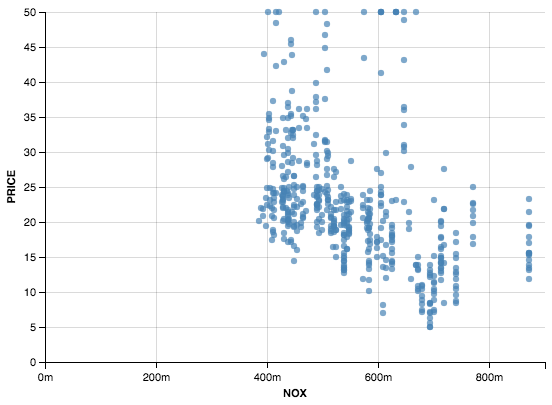

...

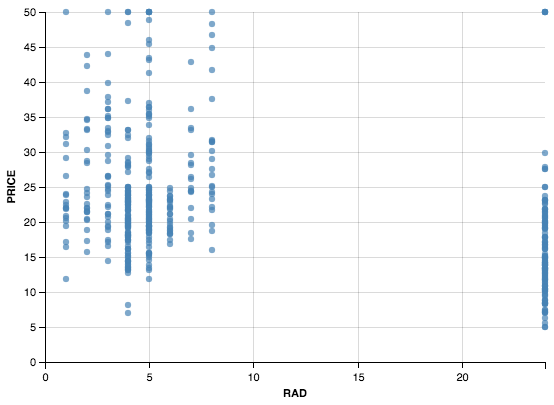

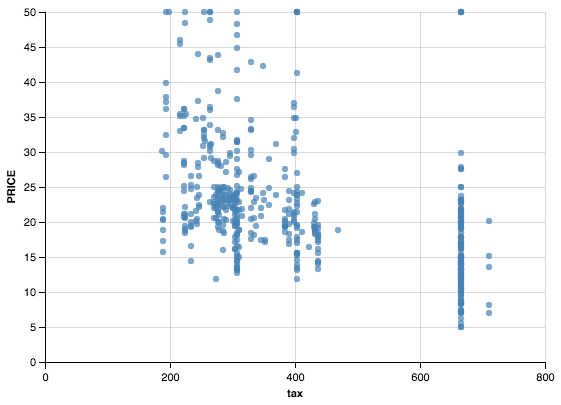

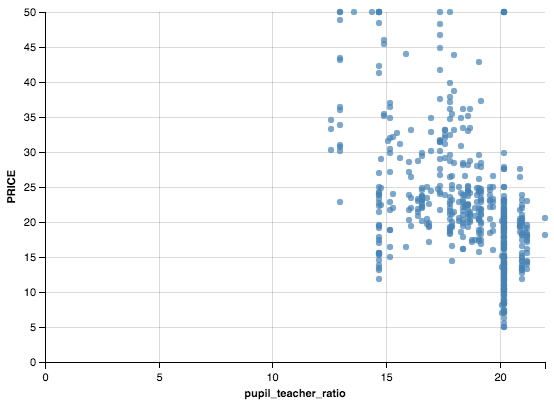

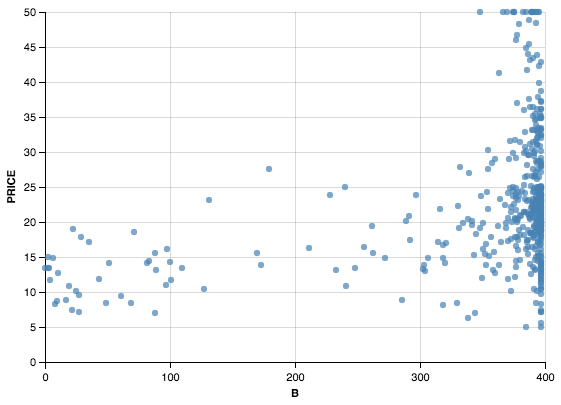

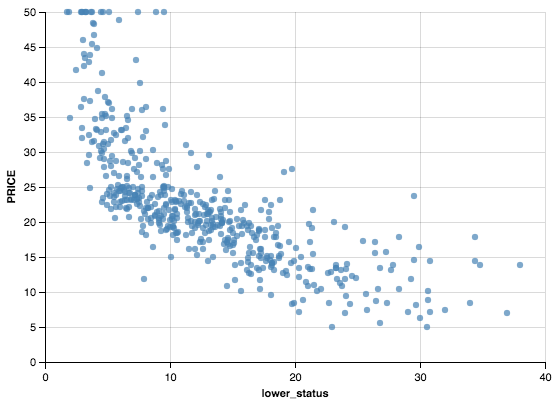

In [191]:
from altair import Chart

for v in df.columns.drop('PRICE'):
    Chart(df).mark_circle().encode(
        x=v,
        y='PRICE'
    ).display()


###  _ ' crime _ rate '~ ' PRICE '

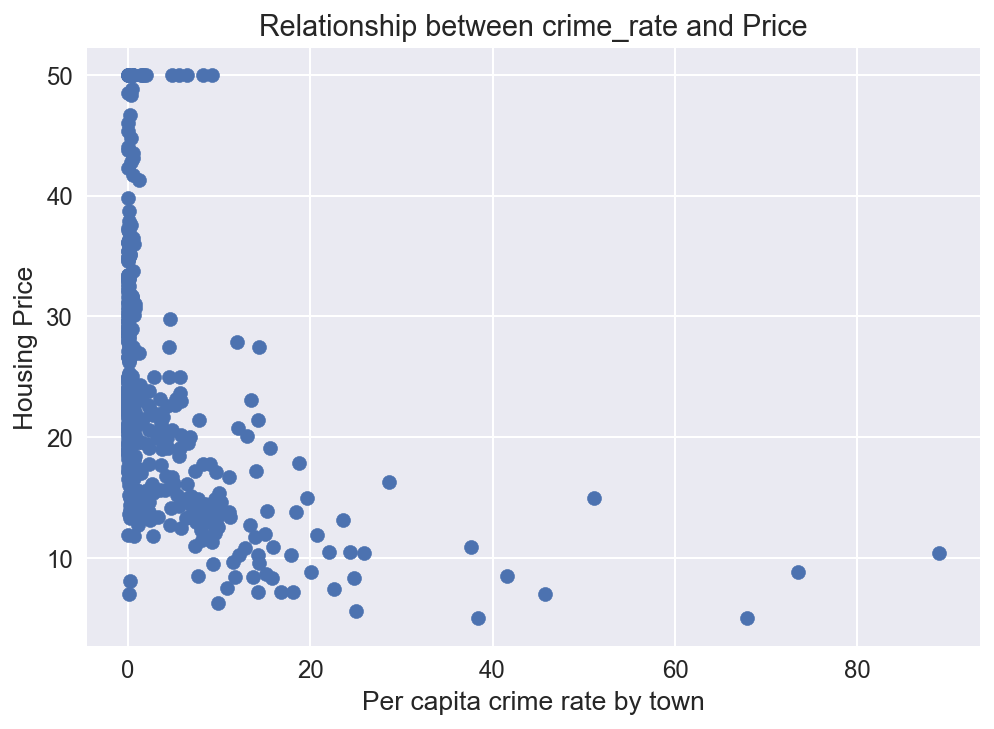

In [192]:
plt.scatter(df.crime_rate, df.PRICE)
plt.xlabel("Per capita crime rate by town")
plt.ylabel("Housing Price")
plt.title("Relationship between crime_rate and Price")

**_correlation coefficient is (-0.385832). The price and crime move in opposite directions (inverze relationship). The relationship is not too strong. _**
**_The points are more scattered, the correlation is weaker.
Non-linear._**

### 'room'~ ' PRICE '

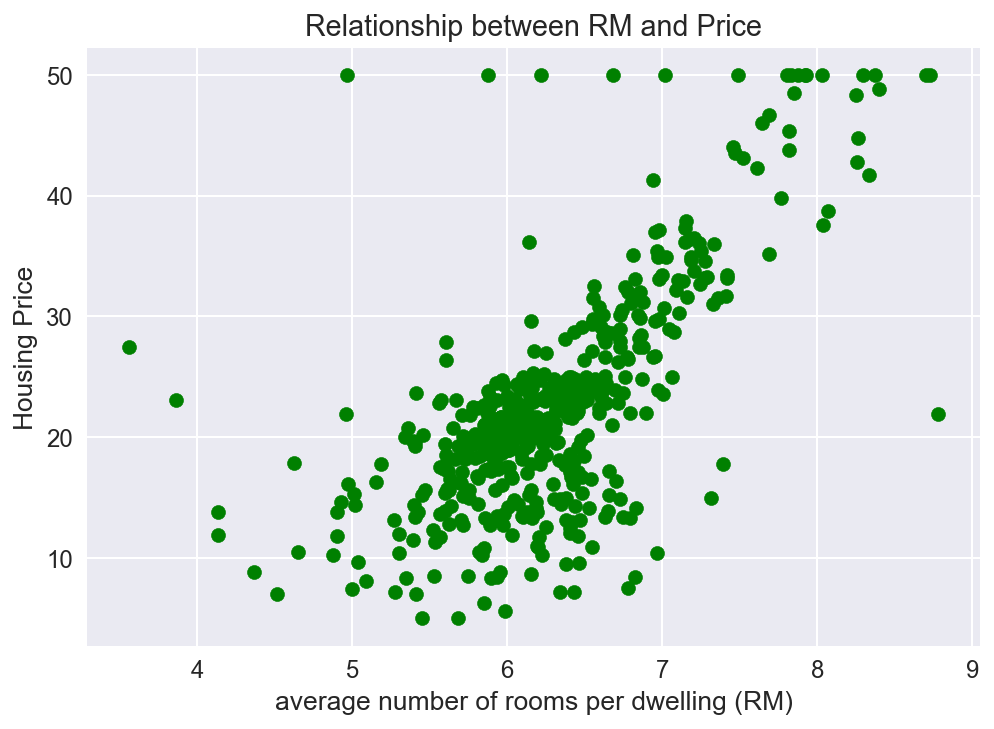

In [193]:
plt.scatter(df.room, df.PRICE, color='green')
plt.xlabel("average number of rooms per dwelling (RM)")
plt.ylabel("Housing Price")
plt.title("Relationship between RM and Price")

##### fit linear regression model

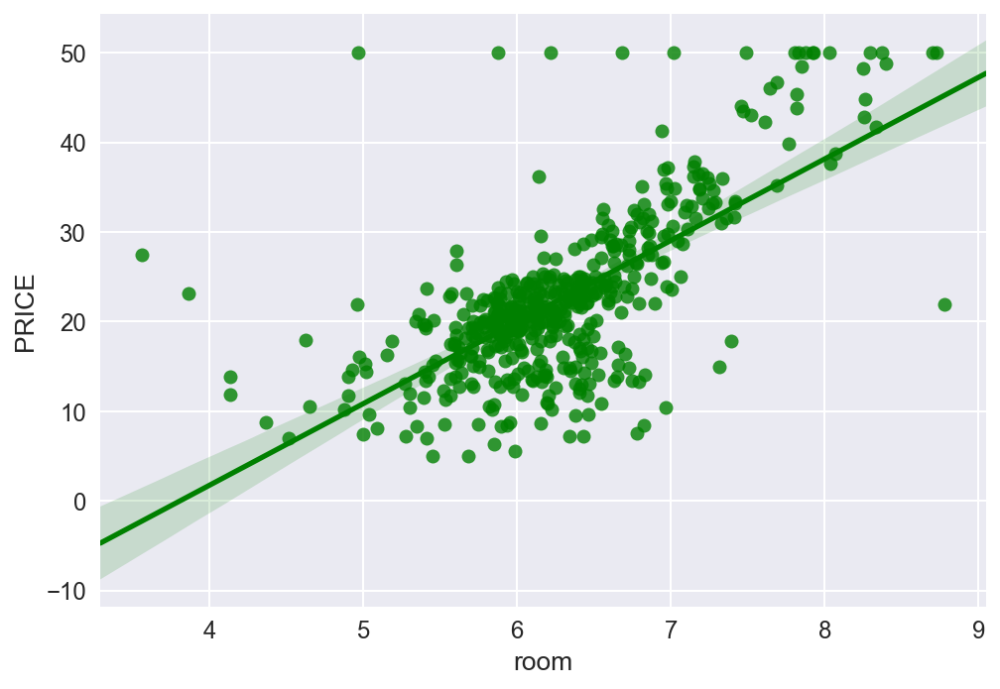

In [194]:
#regplot
sns.regplot(x="room", y="PRICE", data=df, ci=95, color='g')

**Slope of the line is negative--> correlation is negative.<p>
Correlation is affected by outliers. The outliers in the plot reduces the correlation (from 1.00 to 0.695360).**

###   'pupil_teacher_ratio'~ ' PRICE '

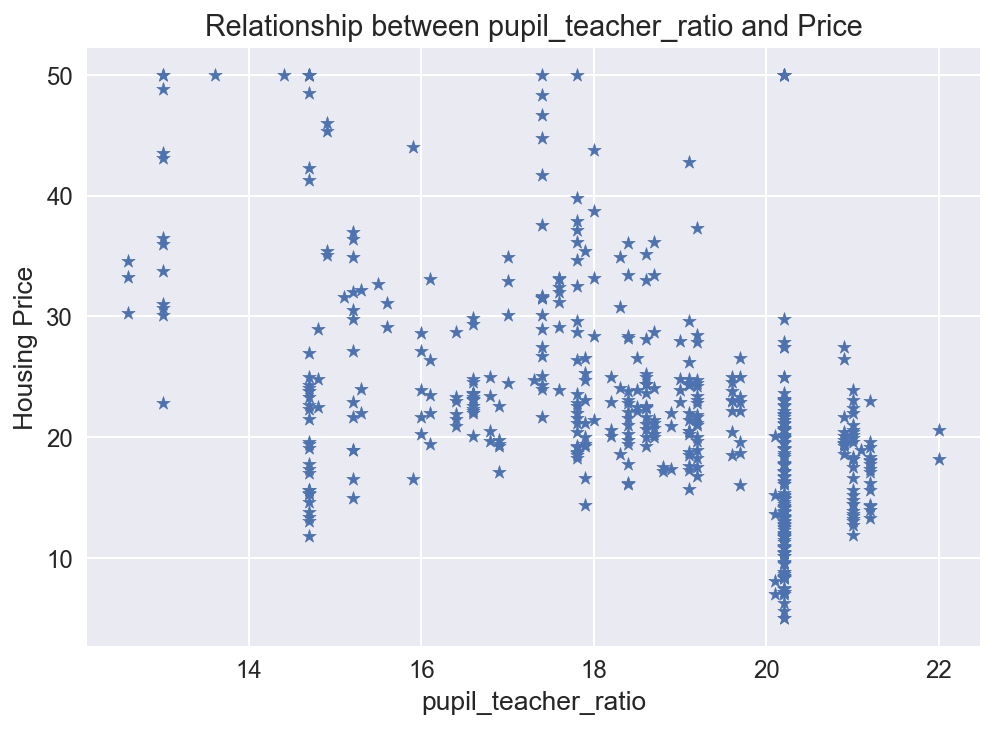

In [195]:
plt.scatter(df.pupil_teacher_ratio, df.PRICE, marker='*')
plt.xlabel("pupil_teacher_ratio")
plt.ylabel("Housing Price")
plt.title("Relationship between pupil_teacher_ratio and Price")

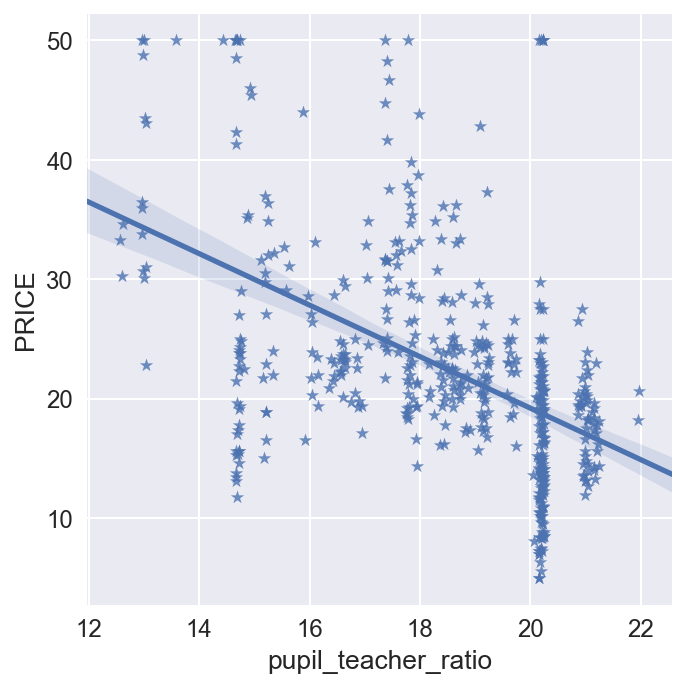

In [196]:
sns.lmplot(x="pupil_teacher_ratio", y="PRICE", data=df, x_jitter=.05, markers='*' )

**correlation coefficient is (-0.507787). Slope is negative --> negative correlation. **

##### _Note_<p>
**Value of r:** -1.0 to -0.5 or 1.0 to 0.5	**_Strength of relationship:_** Strong<p>
**Value of r:** -0.5 to -0.3 or 0.3 to 0.5	**_Strength of relationship:_** Moderate<p>
**Value of r:** -0.3 to -0.1 or 0.1 to 0.3	**_Strength of relationship:_** Weak<p>
**Value of r:** -0.1 to 0.1	                **_Strength of relationship:_** None or very weak<p>

#### Outliers are easy to spot in histogram

In [197]:
cf.go_offline()
df.pupil_teacher_ratio.iplot(kind='hist', xTitle='pupil_teacher_ratio', yTitle='Housing Price')

### ' lower_status '~ ' PRICE '

#### lower_status and Price highly correlate, correlation coefficient is (-0.737663). Strong negative relationship.

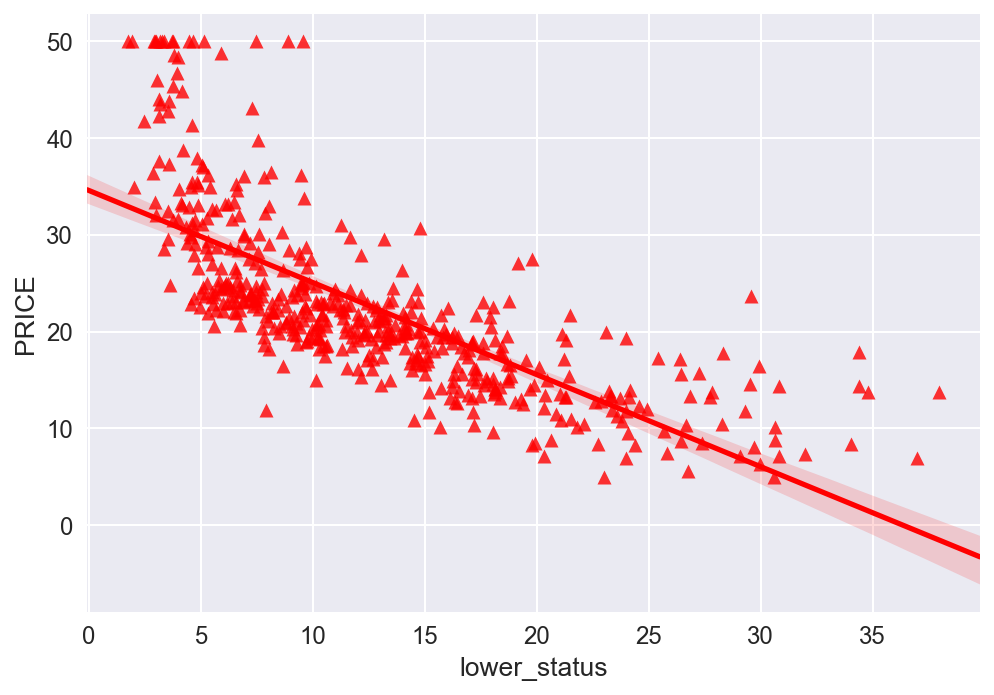

In [198]:
sns.regplot(x="lower_status", y="PRICE", data=df, ci=95, color='r', marker='^')

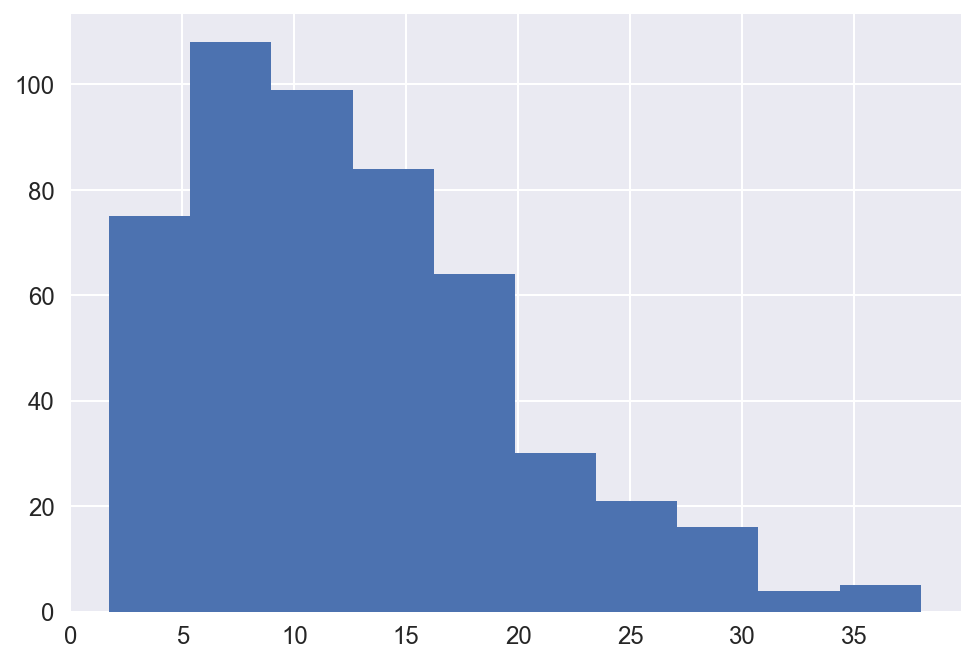

In [199]:
df['lower_status'].hist()

In [282]:
cf.go_offline()
df.lower_status.iplot(kind='hist', xTitle='lower_status', yTitle='Housing Price')

### Fitting Linear Regression using statsmodels

#### Run OLS regression with Pandas DataFrame

#### Fit OLS model

" Ordinary least squares (OLS) or linear least squares is a method for estimating the unknown parameters in a linear regression model, with the goal of minimizing the sum of the squares of the differences between the observed responses (values of the variable being predicted) in the given dataset "
[link](https://en.wikipedia.org/wiki/Ordinary_least_squares)

In [201]:
# Fit regression model (m:= model)
m=ols('PRICE ~ room',data=df).fit()
print (m.summary())

                            OLS Regression Results                            
Dep. Variable:                  PRICE   R-squared:                       0.484
Model:                            OLS   Adj. R-squared:                  0.483
Method:                 Least Squares   F-statistic:                     471.8
Date:                Thu, 06 Apr 2017   Prob (F-statistic):           2.49e-74
Time:                        16:12:29   Log-Likelihood:                -1673.1
No. Observations:                 506   AIC:                             3350.
Df Residuals:                     504   BIC:                             3359.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    -34.6706      2.650    -13.084      0.0

**No. Observations:** Number of observations – number of parameters <p> 
**Df Residuals:** Degrees of freedom of the residuals. n - p - 1, if a constant is present.<p>
**Df Model:** Number of parameters in the model<p>                                                              
**R-squared:** A statistical measure of how well the regression line approximates the real data points [link](https://en.wikipedia.org/wiki/Coefficient_of_determination)<p>
**Adj. R-squared:** R-squared adjusted based on the number of observations and the degrees-of-freedom of the residuals<p>
**F-statistic:** A measure how significant the fit is. The mean squared error of the model divided by the mean squared error of the residuals<p>
**Prob (F-statistic)** The probability that you would get the F-statistic, given the null hypothesis that they are unrelated<p>
**Log-likelihood:**	The log of the likelihood function.<p>
**AIC:** The Akaike Information Criterion. Adjusts the log-likelihood based on the number of observations and the complexity of the model.<p>
**BIC:** The Bayesian Information Criterion. Similar to the AIC, but has a higher penalty for models with more parameters.<p>
**coef:** The estimated value of the coefficient<p>
**std err:** The basic standard error of the estimate of the coefficient. More sophisticated errors are also available.<p>
**t:** The t-statistic value. This is a measure of how statistically significant the coefficient is.<p>
**P > |t|:**	P-value that the null-hypothesis that the coefficient = 0 is true. If it is less than the confidence level, often 0.05, it indicates that there is a statistically significant relationship between the term and the response.<p>
**[0.975]:** 95% Conf. Interval.The lower and upper values of the 95% confidence interval<p>
**Omnibus:** D’Angostino’s test. It provides a combined statistical test for the presence of skewness and kurtosis.<p>
**Prob(Omnibus):** The above statistic turned into a probability<p>
**Skewness:** A measure of the symmetry of the data about the mean. Normally-distributed errors should be symmetrically distributed about the mean (equal amounts above and below the line).<p>
**Kurtosis:** A measure of the shape of the distribution. Compares the amount of data close to the mean with those far away from the mean (in the tails).<p>
**Durbin-Watson:** A test for the presence of autocorrelation (that the errors are not independent.) Often important in time-series analysis<p>
**Jarque-Bera (JB):** A different test of the skewness and kurtosis<p>
**Prob (JB):** The above statistic turned into a probability<p>
**Cond. No:** A test for multicollinearity (if in a fit with multiple parameters, the parameters are related with each other).<p>

Interpreting coefficients
There is a ton of information in this output. But we'll concentrate on the coefficient table (middle table). We can interpret the 'room' coefficient (9.1021) by first noticing that the p-value (under P>|t|) is so small, basically zero. We can interpret the coefficient as, if we compare two groups of towns, one where the average number of rooms is say  55  and the other group is the same except that they all have  66  rooms. For these two groups the average difference in house prices is about  9.19.1  (in thousands) so about  $9,100$9,100  difference. The confidence interval gives us a range of values for this difference ( $8,279,$9,925$8,279,$9,925 ).

### Scatterpot between the predicted prices

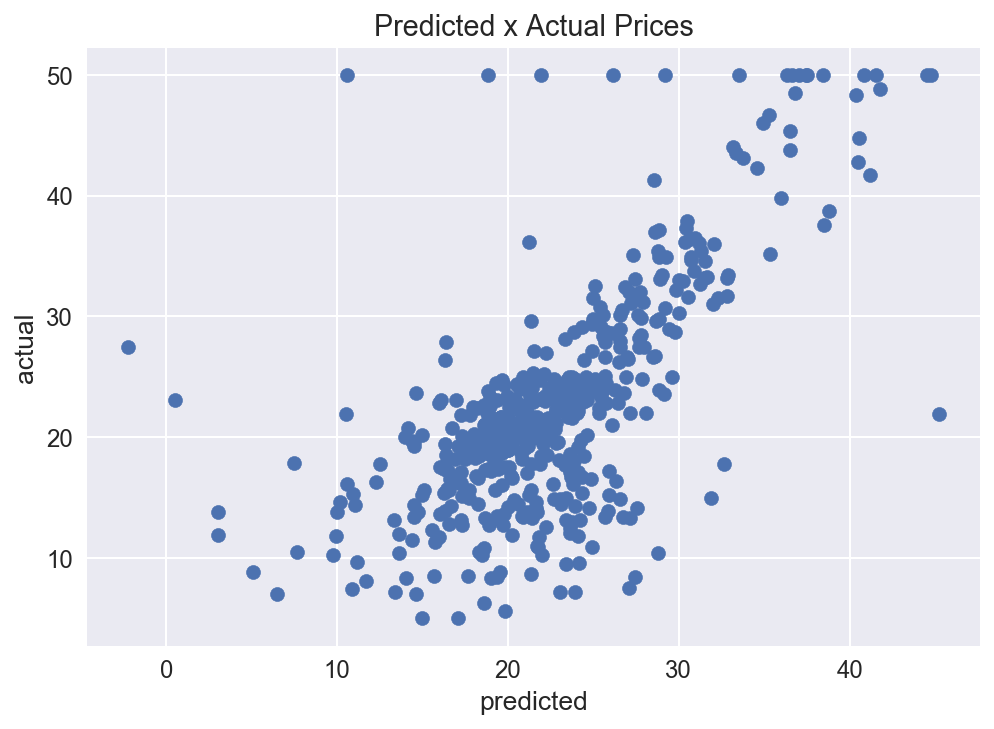

In [202]:
predicted_prices = m.fittedvalues
actual_prices = df.PRICE
plt.scatter(predicted_prices, actual_prices)
plt.title('Predicted x Actual Prices')
plt.xlabel('predicted')
plt.ylabel('actual')

### Fitting Linear Regression using scikit-learn

In [203]:
# This creates a LinearRegression object
lm = LinearRegression()
lm

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [251]:
# fits a linear model
X = df.drop('PRICE', axis = 1)
Y= df.PRICE
lm=lm.fit(X,Y)
lm

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [205]:
# no. of coef
len(lm.coef_)

13

In [206]:
#estimeted int. coef.
estimeted_int_coef=lm.intercept_
estimeted_int_coef

36.491103280363404

In [278]:
# Predict --> using the linear model, estimated coefficients
lm.predict(X)[:10]

array([ 25.91043488,  24.61171933,  31.02743879,  29.4557703 ,
        30.69739886,  24.68663209,  21.1611629 ,  22.49003782,
        17.9295122 ,  21.07257863])

In [208]:
# measure of how close the data are to the fitted regression line (R^2)
lm.score(X,Y)

0.7406077428649428

### Fit a linear model

In [209]:
# Use all 13 predictors to fit linear regression model
lm.fit(X, df.PRICE)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

### Estimated intercept and coefficients

In [210]:
print ('Estimated intercept coefficient:', lm.intercept_)
print ('Number of coefficients:', len(lm.coef_))

Estimated intercept coefficient: 36.4911032804
Number of coefficients: 13


#### Creating DataFrame

In [211]:
lst1=X.columns
lst2=lm.coef_
s=pd.DataFrame({'features': lst1,
     'estimatedCoefficients': lst2,
    })
cols=['features', 'estimatedCoefficients']
s = s[cols]
s

,features,estimatedCoefficients
0,crime_rate,-0.107171
1,zone,0.046395
2,INDUS,0.020860
3,CHAS,2.688561
4,NOX,-17.795759
5,room,3.804752
6,AGE,0.000751
7,distances,-1.475759
8,RAD,0.305655
9,tax,-0.012329


### Predict Prices

In [212]:
# first five predicted prices
lm.predict(X)[:5]

array([ 30.00821269,  25.0298606 ,  30.5702317 ,  28.60814055,  27.94288232])

#### Histogram: Predicted prices

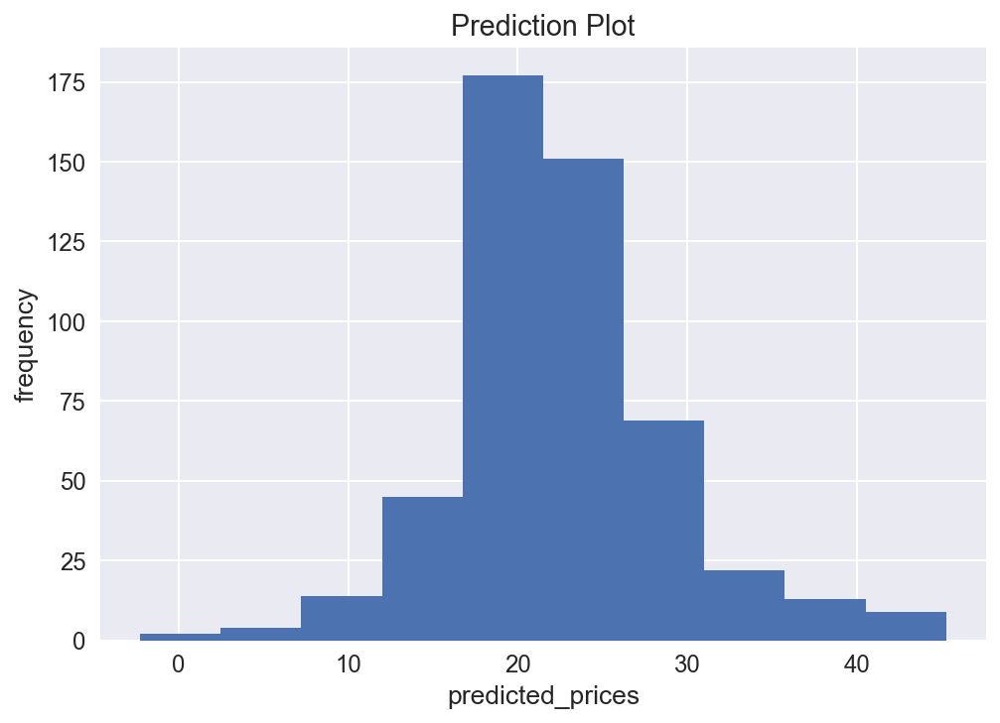

In [213]:
predicted_prices=m.fittedvalues
price=df.PRICE
plt.hist(predicted_prices)
plt.title('Prediction Plot')
plt.xlabel('predicted_prices')
plt.ylabel('frequency')

In [277]:
cf.go_offline()
m.fittedvalues.iplot(kind='hist', xTitle='predicted_prices', yTitle='frequency', bins=50)

#### Scatter Plot 

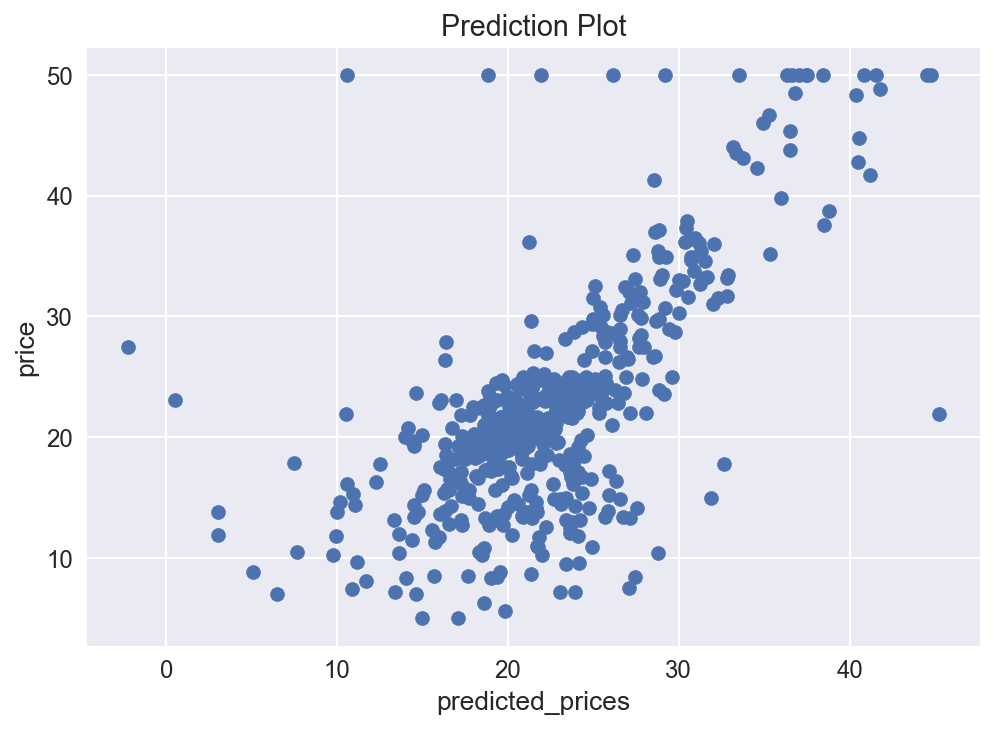

In [215]:
predicted_prices=m.fittedvalues
plt.scatter(predicted_prices, df.PRICE)
plt.title('Prediction Plot')
plt.xlabel('predicted_prices')
plt.ylabel('price')

### Residual sum of squares

In [216]:
print (np.sum((df.PRICE - lm.predict(X)) ** 2))

11080.2762841


### Mean squared error

In [217]:
mse=np.mean((df.PRICE-lm.predict(X))**2)
mse

21.897779217687496

In [218]:
from sklearn.metrics import mean_squared_error

sklearn.metrics.mean_squared_error(df.PRICE, lm.predict(X))

21.897779217687496

### Relationship between pupil_teacher_ratio and housing price

In [219]:
# Create Linear regression object and fit the model

lm = LinearRegression()
lm.fit(X[['pupil_teacher_ratio']].values, df.PRICE)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [220]:
# MSE

msePTRATIO = np.mean((df.PRICE - lm.predict(X[['pupil_teacher_ratio']])) ** 2)
print( msePTRATIO)

62.6522000138


In [221]:
lm.predict

<bound method LinearModel.predict of LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)>

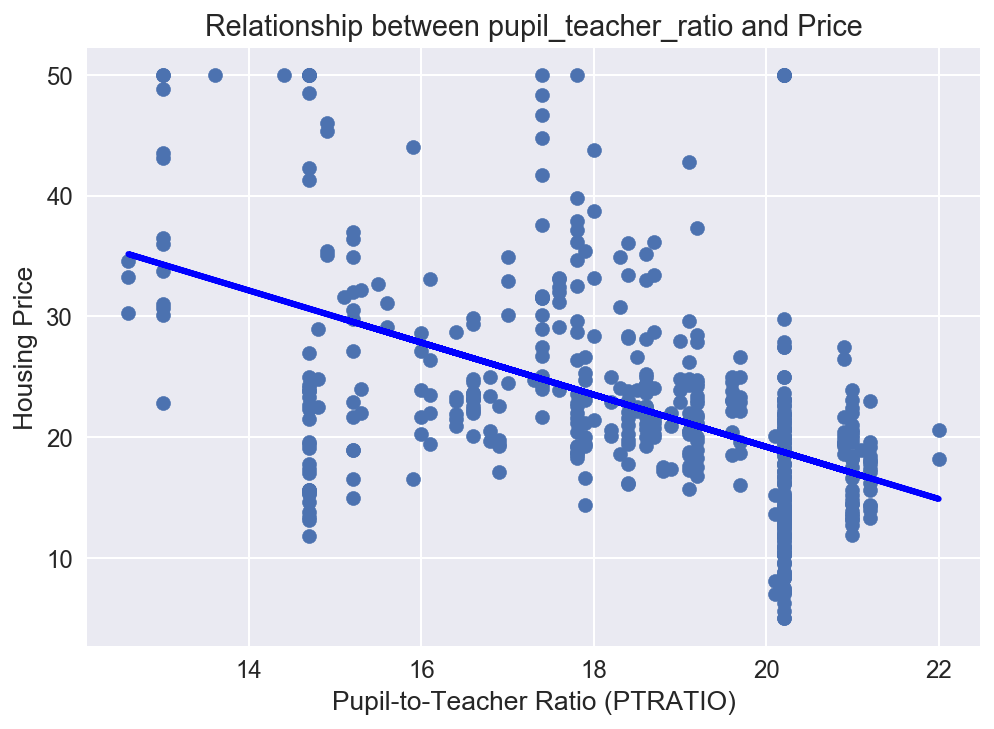

In [222]:
# pupil_teacher_ratio ~ fitted linear regression line

plt.scatter(df.pupil_teacher_ratio, df.PRICE)
plt.xlabel("Pupil-to-Teacher Ratio (PTRATIO)")
plt.ylabel("Housing Price")
plt.title("Relationship between pupil_teacher_ratio and Price")

plt.plot(df.pupil_teacher_ratio, lm.predict(X[['pupil_teacher_ratio']]), color='blue', linewidth=3)
plt.show()

### Relationship between crime_rate, room, pupil_teacher_ratio and housing price
#### Fitting a linear regression model using three independent variables -BV
* 'crime_rate' (per capita crime rate by town)
* 'room' (average number of rooms per dwelling)
* 'pupil_teacher_ratio' (pupil-teacher ratio by town)

#### fit a linear regression model to predict the housing prices

In [252]:
# X = independent variables --> feauters: 'crime_rate', 'room', 'crime_rate'
X=df[['crime_rate', 'room', 'crime_rate']]

# Y = housing price (target)
Y=df.PRICE

#### Regression model

In [253]:
lm = LinearRegression()
lm

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

#### Fitting a linear regression

In [254]:
lm.fit(X, Y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

#### No. of coefficients

In [255]:
print('Number of coefficients:', len(lm.coef_))

Number of coefficients: 3


#### Estimated intercept

In [256]:
print ('Estimated intercept coefficient:', lm.intercept_)

Estimated intercept coefficient: -29.3016813467


#### Construct a DataFrame (features, estimated_coefficients) to see the correlation to the housing price

In [260]:
lst1=X.columns
lst2=lm.coef_
s=pd.DataFrame({'features': lst1,
     'estimatedCoefficients': lst2,
    })
cols=['features', 'estimatedCoefficients']
s = s[cols]
s

,features,estimatedCoefficients
0,crime_rate,-0.130911
1,room,8.397532
2,crime_rate,-0.130911


** The correlation between 'room' and 'PRICE' is quite high.**

#### Predict Y using the linear model with estimated coefficients

In [259]:
lm.predict(X)[:10]

array([ 25.91043488,  24.61171933,  31.02743879,  29.4557703 ,
        30.69739886,  24.68663209,  21.1611629 ,  22.49003782,
        17.9295122 ,  21.07257863])

#### Measure of how well observed outcomes are replicated by the model 
**(the proportion of total variation of outcomes explained by the model)**

In [263]:
lm.score(X,Y)

0.54052238395131202

#### Compare actual and predicted house price

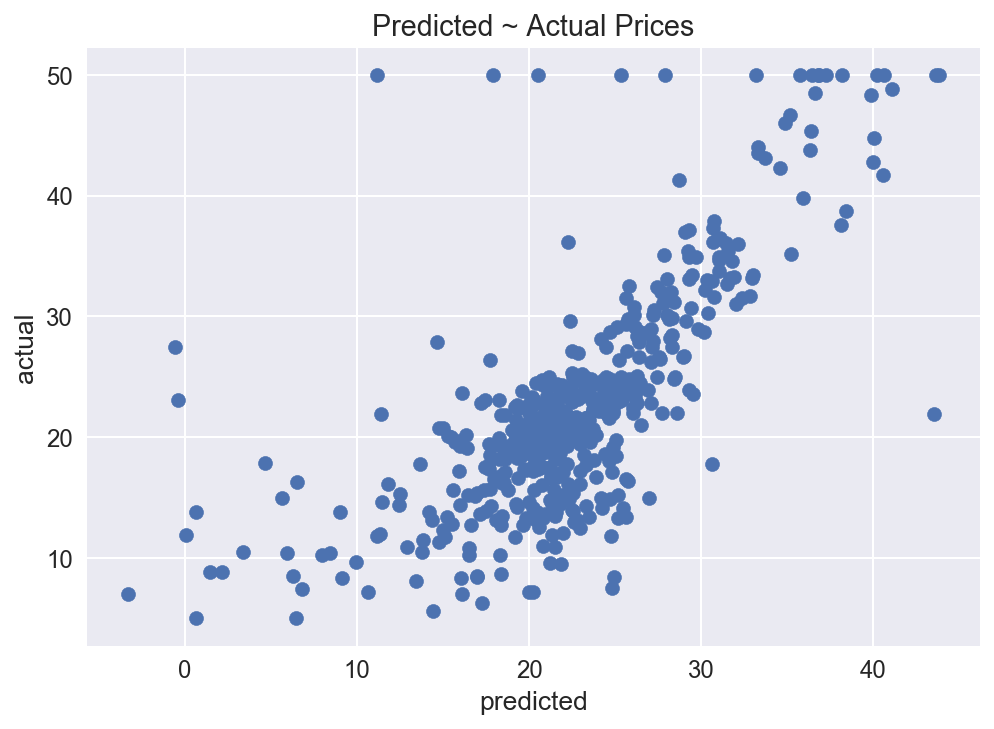

In [266]:
# scatter plot
predicted_prices = lm.predict(X)
actual_prices = df.PRICE
plt.scatter(predicted_prices, actual_prices)
plt.title('Predicted ~ Actual Prices')
plt.xlabel('predicted')
plt.ylabel('actual')

### Evaluation

The [Spearman correlation](https://docs.scipy.org/doc/scipy-0.16.1/reference/generated/scipy.stats.spearmanr.html) is a nonparametric measure of the monotonicity of the relationship between two datasets. Unlike the Pearson correlation, the Spearman correlation does not assume that both datasets are normally distributed. Like other correlation coefficients, this one varies between -1 and +1 with 0 implying no correlation. Correlations of -1 or +1 imply an exact monotonic relationship. Positive correlations imply that as x increases, so does y. Negative correlations imply that as x increases, y decreases.

The p-value roughly indicates the probability of an uncorrelated system producing datasets that have a Spearman correlation at least as extreme as the one computed from these datasets. The p-values are not entirely reliable but are probably reasonable for datasets larger than 500 or so.

In [267]:
from scipy import stats
stats.spearmanr(actual_prices, predicted_prices)

SpearmanrResult(correlation=0.72496661580680433, pvalue=1.2113760896673168e-83)

The mean_squared_error function computes mean square error, a risk metric corresponding to the expected value of the squared (quadratic) error loss or loss.

In [274]:
from sklearn.metrics import mean_squared_error
mean_squared_error(actual_prices, predicted_prices)

38.788896410523293

The median_absolute_error is particularly interesting because it is robust to outliers. The loss is calculated by taking the median of all absolute differences between the target and the prediction

In [268]:
from sklearn.metrics import mean_absolute_error
mean_absolute_error(actual_prices, predicted_prices)

4.1931981917123693

R^2 (coefficient of determination) regression score function

Best possible score is 1.0 and it can be negative (because the model can be arbitrarily worse). A constant model that always predicts the expected value of y, disregarding the input features, would get a R^2 score of 0.0.

lm.score() returns R^2

In [272]:
from sklearn.metrics import r2_score
r2_score(actual_prices, predicted_prices)

0.54052238395131202

### Training and Test Data sets

#### Split arrays or matrices into random train and test subsets ([train_test_split](http://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html))

In [339]:
from sklearn.cross_validation import train_test_split

feautres=list(df.columns.values)

X = df[feautres].values 
y = df.PRICE

X_train, X_test, Y_train, Y_test = train_test_split(X, y, test_size=0.33, random_state = 5)

print (X_train.shape)
print (X_test.shape)
print (Y_train.shape)
print (Y_test.shape)

(339, 14)
(167, 14)
(339,)
(167,)


In [340]:
# Linear regression model
lm=LinearRegression()

#Train the model
lm.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [365]:
# The coefficients
print('Coefficients: \n', lm.coef_)

Coefficients: 
 [[  7.24365952e-02  -4.30991572e-02  -1.49115997e-01  -7.86236544e-01
   -1.53605974e+01  -1.02439664e-01   4.00533481e-02  -1.64041093e-01
    2.95993601e-02   5.78153999e-03  -2.23987250e-01  -1.13033899e-02
   -7.05911751e-02  -5.73087853e-02]]


In [350]:
# prediction

predict_train=lm.predict(X_train)
predict_train[:10]

array([[ 25.56762286],
       [ 25.24751019],
       [ 23.12133939],
       [ 23.31417522],
       [ 22.32572824],
       [ 21.08094593],
       [ 21.76461822],
       [ 26.28006986],
       [ 18.99598421],
       [ 23.16339692]])

In [352]:
predict_test=lm.predict(X_test)
predict_test[:10]

array([[ 24.51432597],
       [ 19.418922  ],
       [ 24.42920412],
       [ 23.13915001],
       [ 20.76596729],
       [ 27.30507795],
       [ 22.32813042],
       [ 23.40152894],
       [ 24.1260821 ],
       [ 23.44602013]])

In [356]:
# The mean squared error for train
print("Mean squared error of train: %.2f"
      % np.mean((lm.predict(X_train) - y_train) ** 2))

Mean squared error of train: 84.11


In [355]:
# The mean squared error for test
print("Mean squared error of test: %.2f"
      % np.mean((lm.predict(X_test) - y_test) ** 2))

Mean squared error of test: 86.01


In [360]:
# R2 score
lm.score(X_test,y_test)

-0.13645839350860944